# Tensorflow 2 Object Detection: Train model



<table align="left"><td>
  <a target="_blank"  href="https://colab.research.google.com/github/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/blob/master/Tensorflow_2_Object_Detection_Train_model.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab
  </a>
</td><td>
  <a target="_blank"  href="https://github.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/blob/master/Tensorflow_2_Object_Detection_Train_model.ipynb">
    <img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
</td></table>

This notebook walks you through training a custom object detection model using the Tensorflow Object Detection API and Tensorflow 2.

The notebook is split into the following parts:
* Install the Tensorflow Object Detection API
* Prepare data for use with the OD API
* Write custom training configuration
* Train detector
* Export model inference graph
* Test trained model


## Installation

Installing the Tensorflow Object Detection API became a lot easier with the relase of Tensorflow 2. The following few cells are all that is needed in order to install the OD API.

In [ ]:
!pip install tensorflow=="2.13.0"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.1/524.1 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 52.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 90.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 31.7 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.12.2
    Uninstalling typing_extensions-4.12.2:
      Successfully uninstalled typing_extensions-4.12.2
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: gast
    Found existing installation: gast 0.6.0
    Uninstalling gast-0.6.0:
      

In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4109, done.
remote: Counting objects: 100% (4109/4109), done.
remote: Compressing objects: 100% (3112/3112), done.
remote: Total 4109 (delta 1190), reused 1988 (delta 935), pack-reused 0
Receiving objects: 100% (4109/4109), 45.36 MiB | 23.88 MiB/s, done.
Resolving deltas: 100% (1190/1190), done.
Updating files: 100% (3718/3718), done.


'tf-models-official >=2.5.1, <2.16.0'

In [ ]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.0/152.0 kB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.15.1


In [ ]:
#run model builder test
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2024-07-29 11:49:40.606260: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-29 11:49:40.606327: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-29 11:49:40.609784: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-29 11:49:40.627462: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-29 11:49:42.279087: W tensorflow/compiler/tf2

## Prepare data

To train a robust model, We need a lot of pictures that vary greatly from each other.

In [ ]:
# Install Kaggle API
!pip install -q kaggle
!pip install -q kaggle-cli

     |████████████████████████████████| 81kB 6.4MB/s 
     |████████████████████████████████| 5.3MB 13.9MB/s 
     |████████████████████████████████| 112kB 60.9MB/s 
     |████████████████████████████████| 51kB 7.7MB/s 
     |████████████████████████████████| 122kB 57.3MB/s 


In [ ]:
# only for google colab
import os
os.environ['KAGGLE_USERNAME'] = "<username>"
os.environ['KAGGLE_KEY'] = "<key>"

In [ ]:
!kaggle datasets download -d tannergi/microcontroller-detection --unzip

 60% 5.00M/8.34M [00:00<00:00, 20.5MB/s]
100% 8.34M/8.34M [00:00<00:00, 27.8MB/s]


In [ ]:
!mv "Microcontroller Detection" microcontroller-detection

mv: cannot stat 'Microcontroller Detection': No such file or directory


In [ ]:
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET

def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

def main():
    for folder in ['train', 'test']:
        image_path = os.path.join('/content', ('microcontroller-detection/' + folder))
        xml_df = xml_to_csv(image_path)
        xml_df.to_csv(os.path.join('/content', 'microcontroller-detection', folder + '_labels.csv'), index=None)
    print('Successfully converted xml to csv.')

# Assuming your data is stored in the 'images/train' and 'images/test' directories in the Colab environment
main()


Successfully converted xml to csv.


In [ ]:
!wget https://raw.githubusercontent.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/master/generate_tfrecord.py

--2024-07-29 11:59:15--  https://raw.githubusercontent.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/master/generate_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3470 (3.4K) [text/plain]
Saving to: ‘generate_tfrecord.py’

generate_tfrecord.p 100%[===================>]   3.39K  --.-KB/s    in 0s      

2024-07-29 11:59:15 (37.7 MB/s) - ‘generate_tfrecord.py’ saved [3470/3470]



In [ ]:
!wget https://raw.githubusercontent.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/master/training/labelmap.pbtxt

--2024-07-26 20:49:22--  https://raw.githubusercontent.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/master/training/labelmap.pbtxt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 177 [text/plain]
Saving to: ‘labelmap.pbtxt’

labelmap.pbtxt      100%[===================>]     177  --.-KB/s    in 0s      

2024-07-26 20:49:22 (2.93 MB/s) - ‘labelmap.pbtxt’ saved [177/177]



In [ ]:
!python generate_tfrecord.py --csv_input=microcontroller-detection/train_labels.csv --image_dir=microcontroller-detection/train --output_path=train.record
!python generate_tfrecord.py --csv_input=microcontroller-detection/test_labels.csv --image_dir=microcontroller-detection/test --output_path=test.record

2024-07-29 11:59:43.057165: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-29 11:59:43.057231: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-29 11:59:43.058825: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-29 11:59:44.516037: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Successfully created the TFRecords: /content/train.record
2024-07-29 11:59:48.286850: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one 

In [ ]:
def generate_labelmap(labels, output_path='labelmap.pbtxt'):
    """
    Generate labelmap.pbtxt file from list of labels.

    Args:
        labels (list): List of labels (class names).
        output_path (str): Path to output labelmap.pbtxt file.
    """
    with open(output_path, 'w') as f:
        for i, label in enumerate(labels):
            f.write("item {\n")
            f.write("  id: {}\n".format(i + 1))
            f.write("  name: '{}'\n".format(label))
            f.write("}\n")

# Define your class names here
labels = ['dust']

# Specify the output path for the labelmap.pbtxt file
output_path = 'labelmap.pbtxt'

# Generate the label map
generate_labelmap(labels, output_path)
print(f'Successfully created the label map at {output_path}')


Successfully created the label map at labelmap.pbtxt


In [ ]:
train_record_path = '/content/train.record'
test_record_path = '/content/test.record'
labelmap_path = '/content/labelmap.pbtxt'

## Configuring training

Now that the data is ready it's time to create a training configuration. The OD API supports lots of models, each with its own config file. In this notebook I'm making use of EfficientDet, but you can replace it with any model available in the [Tensorflow 2 Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md).

In [ ]:
batch_size = 16
num_steps = 10000
num_eval_steps = 1000

In [ ]:
#https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
!tar -xf efficientdet_d0_coco17_tpu-32.tar.gz

--2024-07-29 08:06:31--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.200.207, 74.125.130.207, 74.125.68.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.200.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M  11.4MB/s    in 2.6s    

2024-07-29 08:06:35 (11.4 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



In [ ]:
fine_tune_checkpoint = 'efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0'

In [ ]:
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config

base_config_path = 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config'

--2024-07-29 08:06:41--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’

ssd_efficientdet_d0 100%[===================>]   4.52K  --.-KB/s    in 0s      

2024-07-29 08:06:42 (60.9 MB/s) - ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’ saved [4630/4630]



In [ ]:
# edit configuration file (from https://colab.research.google.com/drive/1sLqFKVV94wm-lglFq_0kGo2ciM0kecWD)

import re

with open(base_config_path) as f:
    config = f.read()

with open('model_config.config', 'w') as f:

  # Set labelmap path
  config = re.sub('label_map_path: ".*?"',
             'label_map_path: "{}"'.format(labelmap_path), config)

  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)

  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")',
                  'input_path: "{}"'.format(train_record_path), config)

  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")',
                  'input_path: "{}"'.format(test_record_path), config)

  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(4), config)

  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)

  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)

  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"',
             'fine_tune_checkpoint_type: "{}"'.format('detection'), config)

  f.write(config)

In [ ]:
%cat model_config.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      m

In [ ]:
model_dir = 'training/'
pipeline_config_path = 'model_config.config'

In [ ]:
import shutil
import re

original_path = '/usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py'

# Read the file
with open(original_path, 'r') as file:
    content = file.read()

# Modify the content
content = re.sub(r'import abc', 'import tensorflow as tf\n\nimport abc', content)
content = re.sub(r'control_flow_ops.case', 'tf.case', content)
content = re.sub(r'control_flow_ops.cond', 'tf.compat.v1.cond', content)

# Write the modified content back to the file
with open(original_path, 'w') as file:
    file.write(content)

print(f"File {original_path} fixed.")


File /usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py fixed.


## Train detector

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2024-07-29 08:07:34.691080: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-29 08:07:34.691127: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-29 08:07:34.692778: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-29 08:07:34.700108: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-29 08:07:35.659712: W tensorflow/comp

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

## Export model inference graph

In [ ]:
output_directory = 'inference_graph'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}

2024-07-29 09:35:07.061015: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-29 09:35:07.061103: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-29 09:35:07.063050: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-29 09:35:07.074301: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-29 09:35:08.592446: W tensorflow/comp

In [ ]:
!zip -r output.zip /content/inference_graph

  adding: content/inference_graph/ (stored 0%)
  adding: content/inference_graph/checkpoint/ (stored 0%)
  adding: content/inference_graph/checkpoint/ckpt-0.index (deflated 80%)
  adding: content/inference_graph/checkpoint/checkpoint (deflated 41%)
  adding: content/inference_graph/checkpoint/ckpt-0.data-00000-of-00001 (deflated 36%)
  adding: content/inference_graph/saved_model/ (stored 0%)
  adding: content/inference_graph/saved_model/variables/ (stored 0%)
  adding: content/inference_graph/saved_model/variables/variables.data-00000-of-00001 (deflated 36%)
  adding: content/inference_graph/saved_model/variables/variables.index (deflated 78%)
  adding: content/inference_graph/saved_model/saved_model.pb (deflated 92%)
  adding: content/inference_graph/saved_model/assets/ (stored 0%)
  adding: content/inference_graph/saved_model/fingerprint.pb (stored 0%)
  adding: content/inference_graph/pipeline.config (deflated 68%)


In [ ]:
from google.colab import files
files.download('/content/inference_graph/saved_model/saved_model.pb')

In [ ]:
!unzip model.zip -d /content/

Archive:  model.zip
   creating: /content/content/inference_graph/
   creating: /content/content/inference_graph/checkpoint/
  inflating: /content/content/inference_graph/checkpoint/ckpt-0.index  
  inflating: /content/content/inference_graph/checkpoint/checkpoint  
  inflating: /content/content/inference_graph/checkpoint/ckpt-0.data-00000-of-00001  
   creating: /content/content/inference_graph/saved_model/
   creating: /content/content/inference_graph/saved_model/variables/
  inflating: /content/content/inference_graph/saved_model/variables/variables.data-00000-of-00001  
  inflating: /content/content/inference_graph/saved_model/variables/variables.index  
  inflating: /content/content/inference_graph/saved_model/saved_model.pb  
   creating: /content/content/inference_graph/saved_model/assets/
 extracting: /content/content/inference_graph/saved_model/fingerprint.pb  
  inflating: /content/content/inference_graph/pipeline.config  


## Test trained model on test images

based on [Object Detection API Demo](https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/object_detection_tutorial.ipynb) and [Inference from saved model tf2 colab](https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/inference_from_saved_model_tf2_colab.ipynb).

In [ ]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [ ]:
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)

In [ ]:
tf.keras.backend.clear_session()
model = tf.saved_model.load('/content/inference_graph/content/inference_graph/saved_model')

In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy()
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

  return output_dict

In [ ]:
for image_path in glob.glob('/content/test/*.jpg'):
  image_np = load_image_into_numpy_array(image_path)
  output_dict = run_inference_for_single_image(model, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=3)
  display(Image.fromarray(image_np))

ValueError: cannot reshape array of size 2779048 into shape (766,907,3)

# Measure model performence


In [ ]:
#remove folder
!rm -r /content/mAP/outputs

Importing mAP calculator and convert xml to text.

In [ ]:
%%bash
# Clone the mAP repository and setup directories
git clone https://github.com/Cartucho/mAP /content/mAP
cd /content/mAP
rm input/detection-results/*
rm input/ground-truth/*
rm input/images-optional/*
wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py

Cloning into '/content/mAP'...
--2024-07-30 07:11:08--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5397 (5.3K) [text/plain]
Saving to: ‘calculate_map_cartucho.py’

     0K .....                                                 100% 31.3M=0s

2024-07-30 07:11:09 (31.3 MB/s) - ‘calculate_map_cartucho.py’ saved [5397/5397]



In [ ]:
!cp /content/test/* /content/mAP/input/images-optional # Copy images and xml files
!mv /content/mAP/input/images-optional/*.xml /content/mAP/input/ground-truth/  # Move xml files to the appropriate folder
!python /content/mAP/scripts/extra/convert_gt_xml.py

Conversion completed!


Model test and save result in the text. Also converted tensor built in format to axis based.

In [ ]:
import os
import numpy as np
import tensorflow as tf
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# Load image into numpy array
def load_image_into_numpy_array(image_path):
    return np.array(Image.open(image_path))

# Resize image to target size
def resize_image(image, target_size):
    image = Image.fromarray(image)
    image = image.resize(target_size, Image.LANCZOS)
    return np.array(image)

# Run inference on a single image
def run_inference_for_single_image(model, image):
    target_size = (640, 640)  # Adjust according to your model's input size
    image_resized = resize_image(image, target_size)

    # Convert image to tensor and add batch dimension
    input_tensor = tf.convert_to_tensor(image_resized, dtype=tf.uint8)
    if len(input_tensor.shape) == 3:
        input_tensor = input_tensor[tf.newaxis, ...]  # Add batch dimension

    # Run inference
    model_fn = model.signatures['serving_default']
    output_dict = model_fn(input_tensor)

    # Process output
    num_detections = int(output_dict['num_detections'][0].numpy())
    output_dict = {
        'detection_boxes': output_dict['detection_boxes'][0, :num_detections].numpy(),
        'detection_classes': output_dict['detection_classes'][0, :num_detections].numpy(),
        'detection_scores': output_dict['detection_scores'][0, :num_detections].numpy(),
        'num_detections': num_detections
    }

    return output_dict

# Save detection results to a file
def save_detection_results(image_path, output_dict, label_map, results_dir, original_image_size, min_conf_threshold=0.1):
    image_id = os.path.splitext(os.path.basename(image_path))[0]
    result_file = os.path.join(results_dir, f'{image_id}.txt')

    with open(result_file, 'w') as f:
        # Write detection results
        for i in range(int(output_dict['num_detections'])):
            score = output_dict['detection_scores'][i]
            if score >= min_conf_threshold:
                box = output_dict['detection_boxes'][i]
                class_id = int(output_dict['detection_classes'][i])
                class_name = label_map.get(class_id, 'unknown')  # Map class_id to class_name

                # Convert bounding box coordinates from normalized to absolute
                ymin, xmin, ymax, xmax = box
                xmin *= original_image_size[0]
                ymin *= original_image_size[1]
                xmax *= original_image_size[0]
                ymax *= original_image_size[1]

                # Write to file
                f.write(f"{class_name} {score:.4f} {xmin:.2f} {ymin:.2f} {xmax:.2f} {ymax:.2f}\n")

# Draw bounding boxes on image
def draw_boxes_on_image(image, output_dict, original_image_size):
    image = Image.fromarray(image)
    draw = ImageDraw.Draw(image)

    for i in range(int(output_dict['num_detections'])):
        score = output_dict['detection_scores'][i]
        if score >= 0.1:  # Set min confidence threshold
            box = output_dict['detection_boxes'][i]
            ymin, xmin, ymax, xmax = box

            # Convert bounding box coordinates from normalized to absolute
            xmin *= original_image_size[0]
            ymin *= original_image_size[1]
            xmax *= original_image_size[0]
            ymax *= original_image_size[1]

            # Draw the bounding box
            draw.rectangle([xmin, ymin, xmax, ymax], outline='red', width=3)
            draw.text((xmin, ymin), f'{score:.2f}', fill='red')

    return np.array(image)

# Display image
def display_image(image):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Process directory of images
def process_image_directory(model, input_dir, results_dir, label_map, target_size=(512, 512), min_conf_threshold=0.1):
    if not os.path.exists(results_dir):
        os.makedirs(results_dir)

    for image_file in os.listdir(input_dir):
        if image_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_path = os.path.join(input_dir, image_file)
            print(f"Processing {image_path}...")

            # Load and process image
            image = load_image_into_numpy_array(image_path)
            original_image_size = image.shape[1], image.shape[0]

            # Run inference
            output_dict = run_inference_for_single_image(model, image)

            # Draw bounding boxes
            detection_image = draw_boxes_on_image(image, output_dict, original_image_size)

            # Resize detection image for display
            detection_image = resize_image(detection_image, target_size)

            # Save results
            save_detection_results(image_path, output_dict, label_map, results_dir, original_image_size, min_conf_threshold)

            # Display image
            display_image(detection_image)

# Load model
model_path = '/content/inference_graph/content/inference_graph/saved_model'  # Replace with your model path
model = tf.saved_model.load(model_path)

# Example usage
input_dir = '/content/microcontroller-detection/valid'
results_dir = '/content/mAP/input/detection-results'
label_map = {1: 'dust'}  # Example label map, adjust as needed
process_image_directory(model, input_dir, results_dir, label_map)


Calculate mAP from ground-truth and detection-results

In [ ]:
import os
import numpy as np
from collections import defaultdict

# Load ground truth annotations from text files
def load_ground_truth_annotations(gt_dir):
    annotations = defaultdict(list)
    for file in os.listdir(gt_dir):
        if file.endswith('.txt'):
            image_id = os.path.splitext(file)[0]
            with open(os.path.join(gt_dir, file)) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_name = parts[0]
                        xmin = float(parts[1])
                        ymin = float(parts[2])
                        xmax = float(parts[3])
                        ymax = float(parts[4])
                        annotations[class_name].append((xmin, ymin, xmax, ymax))
    return annotations

# Load detection results from text files
def load_detection_results(det_dir):
    detections = defaultdict(list)
    for file in os.listdir(det_dir):
        if file.endswith('.txt'):
            image_id = os.path.splitext(file)[0]
            with open(os.path.join(det_dir, file)) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 6:
                        class_name = parts[0]
                        score = float(parts[1])
                        xmin = float(parts[2])
                        ymin = float(parts[3])
                        xmax = float(parts[4])
                        ymax = float(parts[5])
                        detections[class_name].append((score, xmin, ymin, xmax, ymax))
    return detections

# Calculate Intersection over Union (IoU)
def compute_iou(box1, box2):
    xmin1, ymin1, xmax1, ymax1 = box1
    xmin2, ymin2, xmax2, ymax2 = box2

    xi1 = max(xmin1, xmin2)
    yi1 = max(ymin1, ymin2)
    xi2 = min(xmax1, xmax2)
    yi2 = min(ymax1, ymax2)

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = (xmax1 - xmin1) * (ymax1 - ymin1)
    box2_area = (xmax2 - xmin2) * (ymax2 - ymin2)
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

# Calculate Precision and Recall
def compute_precision_recall(gt_annotations, det_results, iou_threshold=0.5):
    class_names = set(gt_annotations.keys()).union(set(det_results.keys()))
    ap_scores = {}
    for class_name in class_names:
        gt_boxes = gt_annotations.get(class_name, [])
        det_boxes = sorted(det_results.get(class_name, []), key=lambda x: x[0], reverse=True)
        if not gt_boxes:
            ap_scores[class_name] = 0
            continue

        # Initialize true positives and false positives
        tp = np.zeros(len(det_boxes))
        fp = np.zeros(len(det_boxes))
        detected_boxes = []

        for i, det in enumerate(det_boxes):
            score, *box = det
            best_iou = 0
            best_gt_idx = -1

            for j, gt_box in enumerate(gt_boxes):
                iou = compute_iou(box, gt_box)
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = j

            if best_iou >= iou_threshold:
                if best_gt_idx not in detected_boxes:
                    tp[i] = 1
                    detected_boxes.append(best_gt_idx)
                else:
                    fp[i] = 1
            else:
                fp[i] = 1

        # Compute precision and recall
        tp_cumsum = np.cumsum(tp)
        fp_cumsum = np.cumsum(fp)
        recall = tp_cumsum / len(gt_boxes)
        precision = tp_cumsum / (tp_cumsum + fp_cumsum)
        ap = np.mean(precision)  # Simple mean of precision values

        ap_scores[class_name] = ap

    return ap_scores

# plot precision vs recall
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.plot(recalls, precisions, linewidth=4, color="red", zorder=0)
plt.scatter(recalls[5], precisions[5], zorder=1, linewidth=6)

plt.xlabel("Recall", fontsize=12, fontweight='bold')
plt.ylabel("Precision", fontsize=12, fontweight='bold')
plt.title("Precision-Recall Curve", fontsize=15, fontweight="bold")
plt.show()

# Compute mAP
def compute_map(gt_dir, det_dir, iou_threshold=0.5):
    gt_annotations = load_ground_truth_annotations(gt_dir)
    det_results = load_detection_results(det_dir)
    ap_scores = compute_precision_recall(gt_annotations, det_results, iou_threshold)
    mean_ap = np.mean(list(ap_scores.values()))
    return mean_ap

# Example usage
gt_dir = '/content/mAP/input/ground-truth'
det_dir = '/content/mAP/input/detection-results'
iou_threshold = 0.5
map_score = compute_map(gt_dir, det_dir, iou_threshold)
print(f'mAP: {map_score:.4f}')


mAP: 1.0000


# Model Test and save output in txt, calculate detection box dimension


Processing /content/test/img121.jpg...
Bounding box for dust: [56.38, 485.89, 55.80, 63.80]
Bounding box for dust: [541.25, 504.92, 57.04, 63.97]


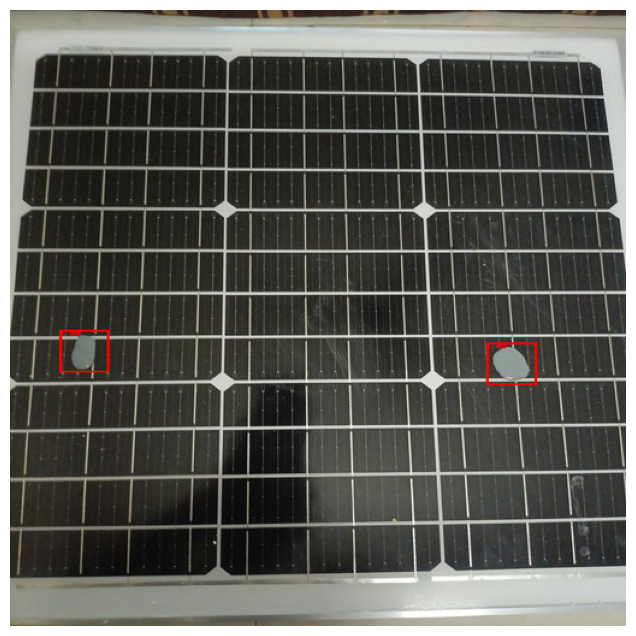

Processing /content/test/img47.jpg...
Bounding box for dust: [92.67, 127.41, 51.07, 59.51]
Bounding box for dust: [512.15, 397.45, 42.16, 50.91]


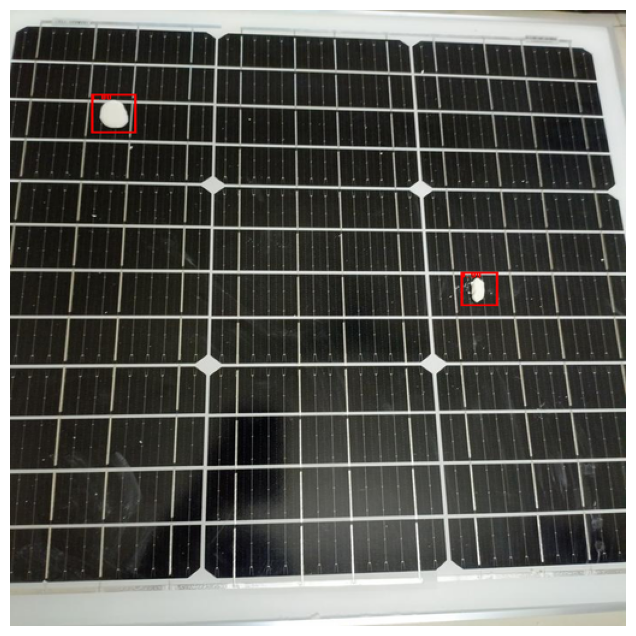

In [ ]:
import os
import numpy as np
import tensorflow as tf
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# Load image into numpy array
def load_image_into_numpy_array(image_path):
    return np.array(Image.open(image_path))

# Resize image to target size
def resize_image(image, target_size):
    image = Image.fromarray(image)
    image = image.resize(target_size, Image.LANCZOS)
    return np.array(image)

# Run inference on a single image
def run_inference_for_single_image(model, image):
    target_size = (512, 512)  # Adjust according to your model's input size
    image_resized = resize_image(image, target_size)

    # Convert image to tensor and add batch dimension
    input_tensor = tf.convert_to_tensor(image_resized, dtype=tf.uint8)
    if len(input_tensor.shape) == 3:
        input_tensor = input_tensor[tf.newaxis, ...]  # Add batch dimension

    # Run inference
    model_fn = model.signatures['serving_default']
    output_dict = model_fn(input_tensor)

    # Process output
    num_detections = int(output_dict['num_detections'][0].numpy())
    output_dict = {
        'detection_boxes': output_dict['detection_boxes'][0, :num_detections].numpy(),
        'detection_classes': output_dict['detection_classes'][0, :num_detections].numpy(),
        'detection_scores': output_dict['detection_scores'][0, :num_detections].numpy(),
        'num_detections': num_detections
    }

    return output_dict

# Save detection results to a file and print bounding box coordinates
def save_detection_results(image_path, output_dict, label_map, results_dir, original_image_size, min_conf_threshold=0.1):
    image_id = os.path.splitext(os.path.basename(image_path))[0]
    result_file = os.path.join(results_dir, f'{image_id}.txt')

    with open(result_file, 'w') as f:
        # Write detection results
        for i in range(int(output_dict['num_detections'])):
            score = output_dict['detection_scores'][i]
            if score >= min_conf_threshold:
                box = output_dict['detection_boxes'][i]
                class_id = int(output_dict['detection_classes'][i])
                class_name = label_map.get(class_id, 'unknown')  # Map class_id to class_name

                # Convert bounding box coordinates from normalized to absolute
                ymin, xmin, ymax, xmax = box
                xmin_abs = xmin * original_image_size[0]
                ymin_abs = ymin * original_image_size[1]
                xmax_abs = xmax * original_image_size[0]
                ymax_abs = ymax * original_image_size[1]

                # Calculate width and height
                width = xmax_abs - xmin_abs
                height = ymax_abs - ymin_abs

                # Print bounding box in [xmin, ymin, width, height] format
                print(f"Bounding box for {class_name}: [{xmin_abs:.2f}, {ymin_abs:.2f}, {width:.2f}, {height:.2f}]")

                # Write to file
                f.write(f"{class_name} {score:.4f} {xmin_abs:.2f} {ymin_abs:.2f} {xmax_abs:.2f} {ymax_abs:.2f}\n")

# Draw bounding boxes on image
def draw_boxes_on_image(image, output_dict, original_image_size):
    image = Image.fromarray(image)
    draw = ImageDraw.Draw(image)

    for i in range(int(output_dict['num_detections'])):
        score = output_dict['detection_scores'][i]
        if score >= 0.1:  # Set min confidence threshold
            box = output_dict['detection_boxes'][i]
            ymin, xmin, ymax, xmax = box

            # Convert bounding box coordinates from normalized to absolute
            xmin_abs = xmin * original_image_size[0]
            ymin_abs = ymin * original_image_size[1]
            xmax_abs = xmax * original_image_size[0]
            ymax_abs = ymax * original_image_size[1]

            # Draw the bounding box
            draw.rectangle([xmin_abs, ymin_abs, xmax_abs, ymax_abs], outline='red', width=3)
            draw.text((xmin_abs, ymin_abs), f'{score:.2f}', fill='red')

    return np.array(image)

# Display image
def display_image(image):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Process directory of images
def process_image_directory(model, input_dir, results_dir, label_map, target_size=(512, 512), min_conf_threshold=0.1):
    if not os.path.exists(results_dir):
        os.makedirs(results_dir)

    for image_file in os.listdir(input_dir):
        if image_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_path = os.path.join(input_dir, image_file)
            print(f"Processing {image_path}...")

            # Load and process image
            image = load_image_into_numpy_array(image_path)
            original_image_size = image.shape[1], image.shape[0]

            # Run inference
            output_dict = run_inference_for_single_image(model, image)

            # Draw bounding boxes
            detection_image = draw_boxes_on_image(image, output_dict, original_image_size)

            # Resize detection image for display
            detection_image = resize_image(detection_image, target_size)

            # Save results
            save_detection_results(image_path, output_dict, label_map, results_dir, original_image_size, min_conf_threshold)

            # Display image
            display_image(detection_image)

# Load model
model_path = '/content/content/inference_graph/saved_model'  # Replace with your model path
model = tf.saved_model.load(model_path)

# Example usage
input_dir = '/content/test'
results_dir = '/content/results'
label_map = {1: 'dust'}  # Example label map, adjust as needed
process_image_directory(model, input_dir, results_dir, label_map)


# Calculate Precision vs Recall

Calculate mAP and plot recision vs recall


In [ ]:
import numpy

y_true = ["positive", "negative", "positive", "negative", "positive", "positive", "negative", "negative", "positive", "negative"]

pred_scores = [0.89, 0.38, 0.92, 0.45, 0.82, 0.95, 0.32, 0.38, 0.91, 0.42]

thresholds = numpy.arange(start=0.2, stop=0.7, step=0.05)

In [ ]:
import sklearn.metrics

def precision_recall_curve(y_true, pred_scores, thresholds):
    precisions = []
    recalls = []

    for threshold in thresholds:
        y_pred = ["positive" if score >= threshold else "negative" for score in pred_scores]

        precision = sklearn.metrics.precision_score(y_true=y_true, y_pred=y_pred, pos_label="positive")
        recall = sklearn.metrics.recall_score(y_true=y_true, y_pred=y_pred, pos_label="positive")

        precisions.append(precision)
        recalls.append(recall)

    return precisions, recalls

In [ ]:
precisions, recalls = precision_recall_curve(y_true=y_true,
                                             pred_scores=pred_scores,
                                             thresholds=thresholds)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.plot(recalls, precisions, linewidth=4, color="red", zorder=0)
plt.scatter(recalls[5], precisions[5], zorder=1, linewidth=6)

plt.xlabel("Recall", fontsize=12, fontweight='bold')
plt.ylabel("Precision", fontsize=12, fontweight='bold')
plt.title("Precision-Recall Curve", fontsize=15, fontweight="bold")
plt.show()

precisions.append(1)
recalls.append(0)

precisions = numpy.array(precisions)
recalls = numpy.array(recalls)

AP = numpy.sum((recalls[:-1] - recalls[1:]) * precisions[:-1])
print(AP)



NameError: name 'recalls' is not defined

# Intersection over Union (IoU)

Calculating bounding box from xml

In [ ]:
import xml.etree.ElementTree as ET

def parse_voc_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    bboxes = []

    for obj in root.findall('object'):
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)

        width = xmax - xmin
        height = ymax - ymin

        bboxes.append([xmin, ymin, width, height])

    return bboxes

# Example usage
xml_file = '/content/test/img47.xml'
bboxes = parse_voc_xml(xml_file)
print(f'Bounding boxes: {bboxes}')


Bounding boxes: [[514, 396, 36, 48], [95, 131, 50, 55]]


calculating iou (detection bounding box calculated above)

<ipython-input-37-a750e5aea59e>:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread("img47.jpg")


Intersection over Union (IoU) calculation:
Detection1 (iou, intersect, union): (0.762224242933666, 1675.8000000000004, 2198.565599999999)
Detection2 (iou, intersect, union): (0.8623840939145838, 2680.7000000000007, 3108.475699999999)


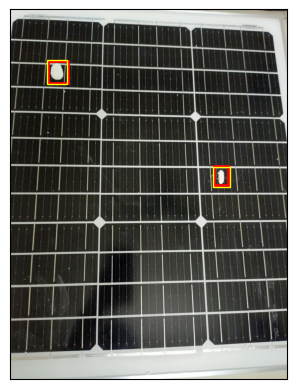

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import imageio

def intersection_over_union(gt_box, pred_box):
    inter_box_top_left = [max(gt_box[0], pred_box[0]), max(gt_box[1], pred_box[1])]
    inter_box_bottom_right = [min(gt_box[0]+gt_box[2], pred_box[0]+pred_box[2]), min(gt_box[1]+gt_box[3], pred_box[1]+pred_box[3])]

    inter_box_w = max(0, inter_box_bottom_right[0] - inter_box_top_left[0])
    inter_box_h = max(0, inter_box_bottom_right[1] - inter_box_top_left[1])

    intersection = inter_box_w * inter_box_h
    union = gt_box[2] * gt_box[3] + pred_box[2] * pred_box[3] - intersection

    iou = intersection / union if union != 0 else 0

    return iou, intersection, union

im = imageio.imread("img47.jpg")

# Scale down the bounding boxes
gt_box = [514, 396, 36, 48]
pred_box = [512.15, 397.45, 42.16, 50.91]


print('Intersection over Union (IoU) calculation:')

iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(f'Detection1 (iou, intersect, union): {iou, intersect, union}')

fig, ax = plt.subplots(1)
ax.imshow(im)

gt_rect = patches.Rectangle((gt_box[0], gt_box[1]),
                            gt_box[2],
                            gt_box[3],
                            linewidth=2,
                            edgecolor='r',
                            facecolor='none')

pred_rect = patches.Rectangle((pred_box[0], pred_box[1]),
                              pred_box[2],
                              pred_box[3],
                              linewidth=1,
                              edgecolor=(1, 1, 0),
                              facecolor='none')
ax.add_patch(gt_rect)
ax.add_patch(pred_rect)

# Scale down the second bounding boxes
gt_box = [95, 131, 50, 55]
pred_box = [92.67, 127.41, 51.07, 59.51]

iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(f'Detection2 (iou, intersect, union): {iou, intersect, union}')

gt_rect = patches.Rectangle((gt_box[0], gt_box[1]),
                            gt_box[2],
                            gt_box[3],
                            linewidth=2,
                            edgecolor='r',
                            facecolor='none')

pred_rect = patches.Rectangle((pred_box[0], pred_box[1]),
                              pred_box[2],
                              pred_box[3],
                              linewidth=1,
                              edgecolor=(1, 1, 0),
                              facecolor='none')
ax.add_patch(gt_rect)
ax.add_patch(pred_rect)

ax.axes.get_xaxis().set_ticks([])
ax.axes.get_yaxis().set_ticks([])

plt.show()


Converting Tensorflow to TFLite

In [ ]:
import tensorflow as tf

# Load the model
saved_model_dir = '/content/content/inference_graph/saved_model'
model = tf.saved_model.load(saved_model_dir)


In [ ]:
converter.experimental_enable_resource_variables = True
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,  # Use built-in TensorFlow Lite operations
    tf.lite.OpsSet.SELECT_TF_OPS     # Enable TensorFlow operations that aren't natively supported by TFLite
]
converter._experimental_lower_tensor_list_ops = False

In [ ]:
import tensorflow as tf

# Load the model
saved_model_dir = '/content/content/inference_graph/saved_model'
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)

# Enable resource variables
converter.experimental_enable_resource_variables = True

# Allow the use of TensorFlow operations
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,
    tf.lite.OpsSet.SELECT_TF_OPS
]

# Disable experimental lowering of TensorList operations
converter._experimental_lower_tensor_list_ops = False

# Convert the model
tflite_model = converter.convert()

# Save the converted model
tflite_model_path = '/content/lite/model.tflite'
with open(tflite_model_path, 'wb') as f:
    f.write(tflite_model)
